## Imports Section:

In [234]:
import numpy as np
import pandas as pd
import math
import scipy
from scipy import stats
import datetime as dt
import dask.dataframe as dd

In [235]:
import librosa
import warnings

In [236]:
import glob
import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches
from pathlib import Path

In [237]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline
import src.file_dealer as file_dealer

In [238]:
import convert_between_detector_file_formats as conversion

In [239]:
from sklearn.cluster import KMeans
LABEL_FOR_GROUPS = {
                    0: 'LF', 
                    1: 'HF'
                    }

## Function and Constant Definitions

In [240]:
FREQ_COLORS = {'LF':'cyan', 'HF':'orange'}
FILE_SITES = {'20220730_053000':'Carp',
 '20220826_070000':'Central',
 '20220727_083000':'Foliage',
 '20220829_090000':'Foliage'}

RAVENPRO_TABLE_EXTENSION = ".txt"
RAVENPRO_TABLE_FORMAT = "\t"
RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR = Path.home() / 'Documents/Research/mila_files/mila-human-wav-txt'
KALEIDOSCOPE_DETS_SAVE_DIR = Path.home() / 'Documents'
BD2_DETS_SAVE_DIR = Path(f'20250130__group_threshold_sweep_results')
TP_CLASSIFICATION_THRESHOLD = 0.012
OVERLAP_TIME_THRESHOLD = 0.012
SITE_NAMES = {'Carp':'Carp Pond', 'Foliage':'Foliage', 'Central':'Central Pond'}

In [241]:
file_keys = list(FILE_SITES.keys())
file_keys

['20220730_053000', '20220826_070000', '20220727_083000', '20220829_090000']

## Following the confusion matrix structure shown below

![image](example_confusion_matrix.png)

In [242]:
all_files_batdetct2_df_true_positives = pd.DataFrame()
all_files_batdetct2_df = pd.DataFrame()
file_key = '20220826_070000'
wav_filename = file_key
site = FILE_SITES[file_key]
plot_file = Path(f'{RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR}/{wav_filename}.WAV')
raventxt_human_filename = f'{wav_filename}_manually_verified_by_AK_with_groups'

snr_included_ravenpro_human_txt = pd.read_csv(f'{RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR}/{raventxt_human_filename}_ravenpro_SNR_aditya_SNR_and_peakfreqtime.txt', sep=RAVENPRO_TABLE_FORMAT)
bd2_human_df_file = snr_included_ravenpro_human_txt.copy()
bd2_human_df_file = bd2_human_df_file.drop(columns=['Selection', 'View', 'Channel'])
bd2_human_df_file.rename(columns={'Begin Time (s)':'start_time',
                            'End Time (s)':'end_time',
                            'Low Freq (Hz)':'low_freq',
                            'High Freq (Hz)':'high_freq',
                            'Delta Time (s)':'delta_time_s',
                            'Manually-Verified Phonic Group':'freq_group',
                            'SNR NIST Quick (dB)':'snr_nist_quick_dB'}, inplace=True)
bd2_human_df_file.sort_values('start_time', inplace=True)
bd2_human_df_file = bd2_human_df_file.reset_index(drop=True)
bd2_human_df_file

,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time
0,1.729564,1.737108,44070.175,51087.719,0.0075,13.66,AK_echolocation,NaN,NaN,HF,2.567162,1.733019
1,3.770500,3.777100,45234.000,54096.000,0.0066,13.72,Echolocation,0.512,20220826_070000.WAV,HF,6.879404,3.773733
2,3.911402,3.918947,43903.720,56927.790,0.0075,15.01,AK_echolocation,NaN,NaN,HF,7.902035,3.914858
3,4.043419,4.050209,44281.690,58478.873,0.0068,11.30,AK_echolocation,NaN,NaN,HF,1.782390,4.046462
4,4.161126,4.170934,43903.720,56507.659,0.0098,11.50,AK_echolocation,NaN,NaN,HF,1.514990,4.166985
...,...,...,...,...,...,...,...,...,...,...,...,...
4401,1787.774500,1787.784900,37500.000,46675.000,0.0104,17.90,Echolocation,0.587,20220826_070000.WAV,HF,9.656562,1787.779767
4402,1787.959500,1787.969400,37500.000,45913.000,0.0099,13.38,Echolocation,0.591,20220826_070000.WAV,HF,6.562988,1787.964100
4403,1788.212500,1788.221200,39218.000,48186.000,0.0087,13.74,Echolocation,0.544,20220826_070000.WAV,HF,8.990165,1788.217133
4404,1788.413500,1788.422500,40078.000,49982.000,0.0090,14.19,Echolocation,0.566,20220826_070000.WAV,HF,5.589297,1788.419000


In [243]:
kdpro_dets_filepath = (KALEIDOSCOPE_DETS_SAVE_DIR / f'{file_key}/output/neutral/cluster.csv')
kdpro_dets_filepath

PosixPath('/Users/adityakrishna/Documents/20220826_070000/output/neutral/cluster.csv')

In [244]:
kdpro_dets = pd.read_csv(kdpro_dets_filepath)
kdpro_dets

,INDIR,FOLDER,IN FILE,CHANNEL,OFFSET,DURATION,Fmin,Fmean,Fmax,DATE,...,TOP2DIST,TOP3MATCH,TOP3DIST,VOCALIZATIONS,MANUAL ID,ORGID,USERID,REVIEW ORGID,REVIEW USERID,INPATHMD5
0,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,4.709715,0.000918,51282.051,52281.289,54835.680,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
1,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,4.851972,0.002218,48780.488,52301.797,55946.789,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
2,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,5.005323,0.001031,45977.012,46553.727,48529.414,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
3,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,5.424584,0.000600,52631.578,53325.504,54794.520,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
4,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,5.785706,0.001057,47905.906,49197.852,52289.812,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,1777.349854,0.004770,39409.824,31024.104,44200.242,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
1002,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,1777.456299,0.000725,41237.113,44127.469,42572.465,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
1003,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,1777.583862,0.001546,42105.262,31053.984,44694.133,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==
1004,/Users/adityakrishna/Documents/20220826_070000...,NaN,20220826_070000.WAV,0,1777.775635,0.002925,40408.164,31450.471,48486.629,2022-08-26,...,0,NaN,0,1,NaN,NaN,NaN,NaN,NaN,Yd/R5i14gj5C3uAfT3jTbQ==


In [245]:
def convert_kaleidoscopedf_to_bd2df(df):
    bd2_df = pd.DataFrame()
    bd2_df['start_time'] = df['OFFSET'] - 0.005
    bd2_df['end_time'] = df['OFFSET'] + df['DURATION'] + 0.01
    bd2_df['low_freq'] = df['Fmin'] - 2000
    bd2_df['high_freq'] = df['Fmax'] + 2000
    bd2_df['input_file'] = df['IN FILE']
    bd2_df['input_dir'] = df['INDIR']
    bd2_df['mean_freq'] = df['Fmean']
    if 'TOP1MATCH*' in df.columns:
        bd2_df['TOP1MATCH*'] = df['TOP1MATCH*']
    if 'TOP1MATCH' in df.columns:
        bd2_df['TOP1MATCH'] = df['TOP1MATCH']
    bd2_df['TOP1DIST'] = df['TOP1DIST']
    bd2_df['TOP2MATCH'] = df['TOP2MATCH']
    bd2_df['TOP2DIST'] = df['TOP2DIST']
    bd2_df['TOP3MATCH'] = df['TOP3MATCH']
    bd2_df['TOP3DIST'] = df['TOP3DIST']
    bd2_df.sort_values('start_time', inplace=True)
    
    return bd2_df

In [246]:
kdpro_dets_bd2_format = convert_kaleidoscopedf_to_bd2df(kdpro_dets)
kdpro_dets_bd2_format

,start_time,end_time,low_freq,high_freq,input_file,input_dir,mean_freq,TOP1MATCH*,TOP1DIST,TOP2MATCH,TOP2DIST,TOP3MATCH,TOP3DIST
0,4.704715,4.720633,49282.051,56835.680,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,52281.289,nocluster,0,NaN,0,NaN,0
1,4.846972,4.864190,46780.488,57946.789,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,52301.797,nocluster,0,NaN,0,NaN,0
2,5.000323,5.016354,43977.012,50529.414,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,46553.727,nocluster,0,NaN,0,NaN,0
3,5.419584,5.435184,50631.578,56794.520,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,53325.504,nocluster,0,NaN,0,NaN,0
4,5.780706,5.796763,45905.906,54289.812,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,49197.852,nocluster,0,NaN,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001,1777.344854,1777.364624,37409.824,46200.242,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,31024.104,nocluster,0,NaN,0,NaN,0
1002,1777.451299,1777.467024,39237.113,44572.465,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,44127.469,nocluster,0,NaN,0,NaN,0
1003,1777.578862,1777.595408,40105.262,46694.133,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,31053.984,nocluster,0,NaN,0,NaN,0
1004,1777.770635,1777.788560,38408.164,50486.629,20220826_070000.WAV,/Users/adityakrishna/Documents/20220826_070000...,31450.471,nocluster,0,NaN,0,NaN,0


In [247]:
def get_section_of_call_in_file(detection, audio_file):
    fs = audio_file.samplerate
    num_frames = audio_file.frames
    file_length = num_frames/fs

    call_dur = (detection['end_time'] - detection['start_time'])
    pad = min(min(detection['start_time'] - call_dur, file_length - detection['end_time']), 0.006) / 3
    start = detection['start_time'] - call_dur - (3*pad)
    duration = ((2 * call_dur) + (4*pad))

    try:
        audio_file.seek(int(fs*start))
        audio_seg = audio_file.read(int(fs*duration))
        length_of_section = call_dur + (2*pad)
    except sf.LibsndfileError as e:
        print(f'Start time : {start} invalid, detection starts at {detection["start_time"]} in segment:{audio_file.name}')
        audio_seg = None
        length_of_section = 0

    return audio_seg, length_of_section, pad

In [248]:
welch_key = 'all_locations'
output_dir = Path(f'{Path().home()}/duty-cycle-investigation/data/generated_welch/{welch_key}')
output_file_type = 'top1_inbouts_welch_signals'
welch_data = pd.read_csv(output_dir / f'2022_{welch_key}_{output_file_type}.csv', index_col=0, low_memory=False)
k = 2
kmean_welch = KMeans(n_clusters=k, n_init=10, random_state=1).fit(welch_data.values)

In [249]:
wav_filename = file_key
site = FILE_SITES[file_key]
raventxt_human_files_dir = f'{Path.home()}/Documents/Research/mila_files/mila-human-wav-txt'
plot_file = Path(f'{raventxt_human_files_dir}/{wav_filename}.WAV')
raventxt_human_filename = f'{wav_filename}_manually_verified_by_AK_with_groups'

audio_file = sf.SoundFile(plot_file)
fs = audio_file.samplerate
nyquist = fs/2
call_snrs = []
peak_freqs_spec = []
peak_freqs_welch =[]
peak_freq_times_spec = []
classes = []
for i, row in kdpro_dets_bd2_format.iterrows():
    call_dur = (row['end_time'] - row['start_time'])
    audio_seg, length_of_section, pad = get_section_of_call_in_file(row, audio_file)
    seg_start = row['start_time'] - call_dur - (3*pad)

    audio_seg, length_of_section = batdetect2_pipeline.get_section_of_call_in_file(row, audio_file)

    freq_pad = 2000
    low_freq_cutoff = row['low_freq']-freq_pad
    high_freq_cutoff = min(nyquist-1, row['high_freq']+freq_pad)
    band_limited_audio_seg = batdetect2_pipeline.bandpass_audio_signal(audio_seg, fs, low_freq_cutoff, high_freq_cutoff)

    signal_for_peaks = band_limited_audio_seg.copy()
    signal_for_peaks[:int(fs*(length_of_section+pad))] = 0
    signal_for_peaks[-int(fs*pad):] = 0
    mpl_specgram_window = plt.mlab.window_hanning(np.ones(256))
    f, t, Sxx = scipy.signal.spectrogram(signal_for_peaks, fs, detrend=False,
                                nfft=256, 
                                window=mpl_specgram_window)
    plt_Sxx = 10*np.log10(Sxx)
    max_ind = np.where(plt_Sxx==np.max(plt_Sxx))
    max_value_across_bins = Sxx[max_ind]
    peak_freq = f[max_ind[0]]
    peak_freq_time = t[max_ind[1]]
    tp_valid = ((seg_start+peak_freq_time[0]) >= row["start_time"])&((seg_start+peak_freq_time[0]) <= row["end_time"])
    # if ~tp_valid:
    #     print(f'Call starting at {row["start_time"]} and ending at {row["end_time"]}, t_peak={round(seg_start+peak_freq_time[0], 4)} and f_peak={round(peak_freq[0], 4)} valid? {tp_valid}')
    #     print(f't_peak={round(seg_start+peak_freq_time[0], 4)} means peak_freq_time={peak_freq_time[0]} happened because plt_Sxx==np.max(plt_Sxx)={np.max(plt_Sxx)}')
    if math.isinf(np.max(plt_Sxx)):
        peak_freqs_spec.append((row['low_freq']+row['high_freq'])/2)
        peak_freq_times_spec.append((row['start_time']+row['end_time'])/2)
    else:
        peak_freqs_spec.append(peak_freq[0])
        peak_freq_times_spec.append(seg_start+peak_freq_time[0])

    signal = band_limited_audio_seg.copy()
    signal[:int(fs*(length_of_section))] = 0
    noise = band_limited_audio_seg - signal
    snr_call_signal = signal[-int(fs*length_of_section):]
    snr_noise_signal = noise[:int(fs*length_of_section)]

    snr = batdetect2_pipeline.get_snr_from_band_limited_signal(snr_call_signal, snr_noise_signal)
    call_snrs.append(snr)

    welch_info = dict()
    welch_info['num_points'] = 100
    max_visible_frequency = 96000
    welch_info['max_freq_visible'] = max_visible_frequency
    welch_signal = batdetect2_pipeline.compute_welch_psd_of_call(snr_call_signal, fs, welch_info)

    peaks = np.where(welch_signal==max(welch_signal))[0][0]
    peak_freqs_welch.append(max_visible_frequency*(peaks/len(welch_signal)))
    
    welch_signal = (welch_signal).reshape(1, len(welch_signal))
    classes.append(LABEL_FOR_GROUPS[kmean_welch.predict(welch_signal)[0]])

kdpro_dets_bd2_format['SNR'] = call_snrs
kdpro_dets_bd2_format['peak_frequency_time_SPECTROGRAM'] = peak_freq_times_spec
kdpro_dets_bd2_format['peak_frequency_SPECTROGRAM'] = peak_freqs_spec
kdpro_dets_bd2_format['peak_frequency_WELCH'] = peak_freqs_welch
kdpro_dets_bd2_format['freq_group'] = classes

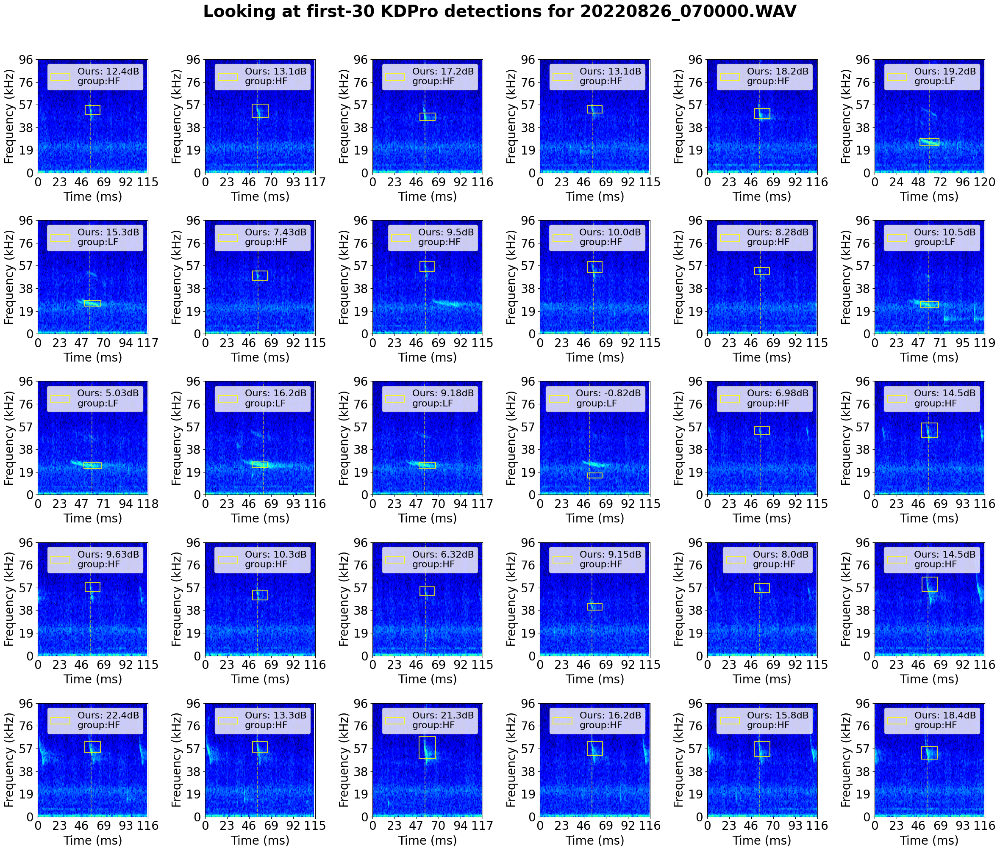

In [250]:
num_samples = 30
side1 = 6
side2 = num_samples//side1
snrbased_selections = kdpro_dets_bd2_format.sort_index()[:num_samples].reset_index(drop=True).copy()
plt.figure(figsize=(4*side1, 4*side2))
plt.rcParams.update({'font.size': 20})
plt.suptitle(f'Looking at first-{num_samples} KDPro detections for 20220826_070000.WAV', y=1.01, fontsize=28, fontweight='bold')
for i, sel_ind in enumerate((snrbased_selections.index).values):
    plt.subplot(side2,side1,i+1)
    selection_row = snrbased_selections.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.05
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.1
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'Ours: {selection_row["SNR"]:.3}dB\ngroup:{selection_row["freq_group"]}')
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='yellow', alpha=0.5)

    other_dets_in_window = kdpro_dets_bd2_format[(kdpro_dets_bd2_format['start_time']>=start)&(kdpro_dets_bd2_format['end_time']<=(start+duration))]
    for i, row in other_dets_in_window.iterrows():  
        if row['start_time']!=selection_row['start_time']:                            
            rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                            (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                            linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
            ax.add_patch(rect)
            ax.axvline(x=row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='yellow', alpha=0.5)

    plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (ms)")
    plt.legend(fontsize=plt.rcParams['font.size']-4)

plt.tight_layout()
plt.show()

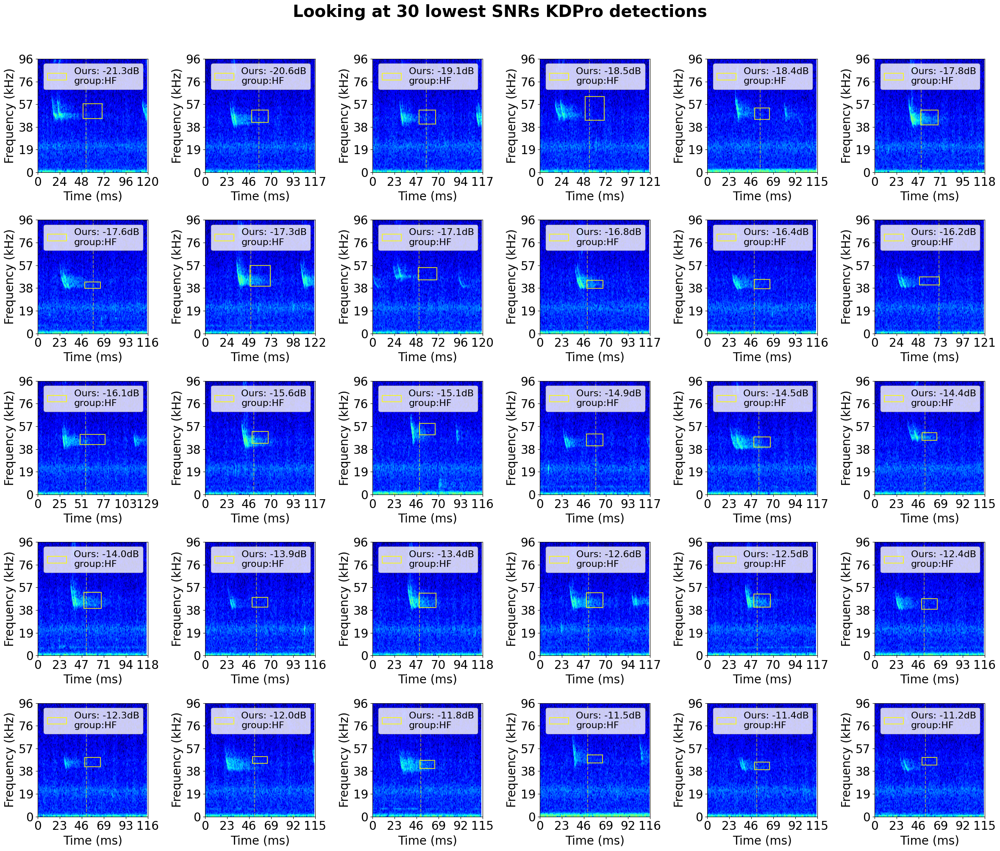

In [251]:
num_samples = 30
side1 = 6
side2 = num_samples//side1
snrbased_selections = kdpro_dets_bd2_format.sort_values('SNR')[:num_samples].reset_index(drop=True).copy()
plt.figure(figsize=(4*side1, 4*side2))
plt.rcParams.update({'font.size': 20})
plt.suptitle(f'Looking at {num_samples} lowest SNRs KDPro detections', y=1.01, fontsize=28, fontweight='bold')
for i, sel_ind in enumerate((snrbased_selections.index).values):
    plt.subplot(side2,side1,i+1)
    selection_row = snrbased_selections.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.05
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.1
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'Ours: {selection_row["SNR"]:.3}dB\ngroup:{selection_row["freq_group"]}')
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='yellow', alpha=0.5)

    other_dets_in_window = kdpro_dets_bd2_format[(kdpro_dets_bd2_format['start_time']>=start)&(kdpro_dets_bd2_format['end_time']<=(start+duration))]
    for i, row in other_dets_in_window.iterrows():  
        if row['start_time']!=selection_row['start_time']:                            
            rect = patches.Rectangle(((row['start_time'] - start), row['low_freq']), 
                            (row['end_time'] - row['start_time']), (row['high_freq'] - row['low_freq']), 
                            linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8)
            ax.add_patch(rect)
            ax.axvline(x=row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='yellow', alpha=0.5)

    plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (ms)")
    plt.legend(fontsize=plt.rcParams['font.size']-4)

plt.tight_layout()
plt.show()

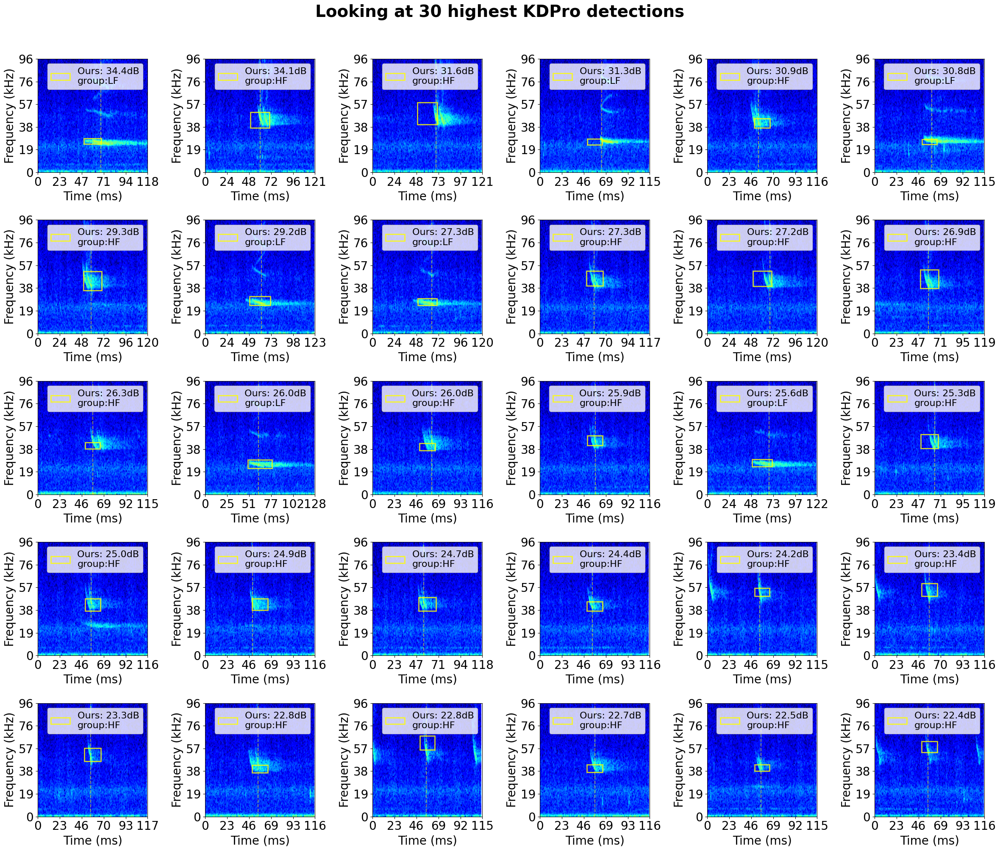

In [252]:
num_samples = 30
side1 = 6
side2 = num_samples//side1
snrbased_selections = kdpro_dets_bd2_format.sort_values('SNR', ascending=False)[:num_samples].reset_index(drop=True).copy()
plt.figure(figsize=(4*side1, 4*side2))
plt.rcParams.update({'font.size': 20})
plt.suptitle(f'Looking at {num_samples} highest KDPro detections', y=1.01, fontsize=28, fontweight='bold')
for i, sel_ind in enumerate((snrbased_selections.index).values):
    plt.subplot(side2,side1,i+1)
    selection_row = snrbased_selections.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.05
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.1
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=2, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'Ours: {selection_row["SNR"]:.3}dB\ngroup:{selection_row["freq_group"]}')
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='yellow', alpha=0.5)
    plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (ms)")
    plt.legend(fontsize=plt.rcParams['font.size']-4)

plt.tight_layout()
plt.show()

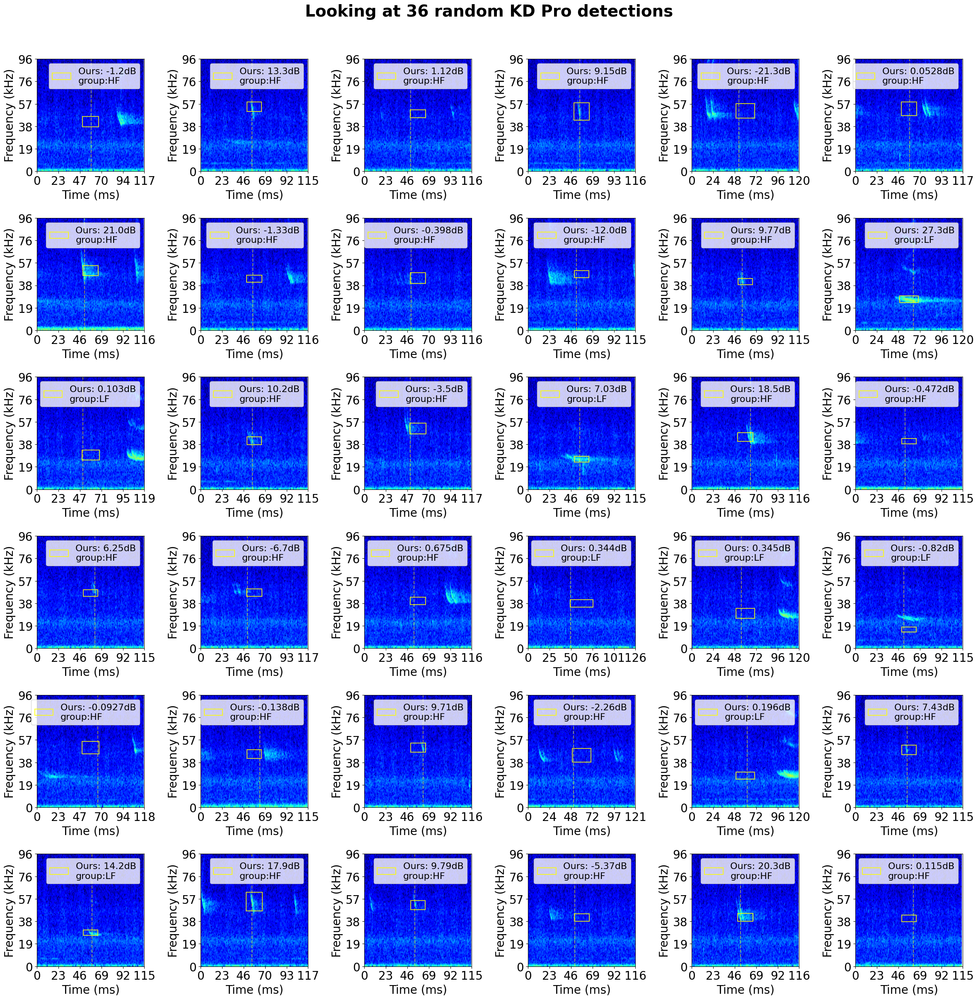

In [253]:
num_samples = 36
side = int(num_samples**0.5)
snrbased_selections = kdpro_dets_bd2_format.sample(n=num_samples).reset_index(drop=True).copy()
plt.figure(figsize=(4*side, 4*side))
plt.rcParams.update({'font.size': 20})
plt.suptitle(f'Looking at {num_samples} random KD Pro detections', y=1.01, fontsize=28, fontweight='bold')
for i, sel_ind in enumerate((snrbased_selections.index).values):
    plt.subplot(side,side,i+1)
    selection_row = snrbased_selections.iloc[sel_ind]
    file_name = f'{wav_filename}.WAV'
    file_path = Path(RAVENTXT_HUMAN_ANNOTATIONS_SAVE_DIR) / file_name
    audio_file = sf.SoundFile(file_path)
    fs = audio_file.samplerate

    start = selection_row['start_time']-0.05
    audio_file.seek(int(fs*(start)))
    duration = (selection_row['end_time']-selection_row['start_time'])+0.1
    audio_seg = audio_file.read(int(fs*duration))

    plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

    ax = plt.gca()
    rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                    (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                    linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'Ours: {selection_row["SNR"]:.3}dB\ngroup:{selection_row["freq_group"]}')
    ax.add_patch(rect)
    ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='yellow', alpha=0.5)
    plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
    plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (ms)")
    plt.legend(fontsize=plt.rcParams['font.size']-4)

plt.tight_layout()
plt.show()

In [254]:
def return_true_positives_using_human_df(human_df, machine_df):
    dist_matrix = np.zeros((len(machine_df), len(human_df)))
    association_matrix = np.zeros((len(machine_df), len(human_df)), dtype='bool')
    collect_human = pd.DataFrame()
    collect_bd2 = pd.DataFrame()
    for index in range(len(machine_df)):
        batdetect2_row = machine_df.iloc[index]
        dist_to_all_calls = ((human_df['peak_frequency_time'] - batdetect2_row['peak_frequency_time_SPECTROGRAM']).values)
        dist_matrix[index,:] = dist_to_all_calls
    
        dist_to_all_calls[np.abs(dist_to_all_calls)>=TP_CLASSIFICATION_THRESHOLD] = 1
        dist_to_all_calls[np.abs(dist_to_all_calls)<TP_CLASSIFICATION_THRESHOLD] = 0
        if np.abs(dist_to_all_calls-1).sum() > 1:
            collect_human = pd.concat([collect_human, human_df[dist_to_all_calls<0.5]])
            collect_bd2 = pd.concat([collect_bd2, pd.DataFrame(batdetect2_row).T])

        association_matrix[index,:] = ~dist_to_all_calls.astype('bool')

    human_bd2_true_positives = human_df.loc[np.logical_or.reduce(association_matrix, axis=0)]
    machine_false_negatives = human_df.loc[~(np.logical_or.reduce(association_matrix, axis=0))]
    machine_true_positives = machine_df.loc[np.logical_or.reduce(association_matrix, axis=1)]
    machine_false_positives = machine_df.loc[~(np.logical_or.reduce(association_matrix, axis=1))]

    separated_performance_dfs = dict()
    separated_performance_dfs['machine_true_positives'] = machine_true_positives
    separated_performance_dfs['machine_false_positives'] = machine_false_positives
    separated_performance_dfs['machine_false_negatives'] = machine_false_negatives
    separated_performance_dfs['human_true_positives'] = human_bd2_true_positives

    return association_matrix, separated_performance_dfs

In [255]:
lf_bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['freq_group']=='LF'].reset_index(drop=True).copy()
hf_bd2_human_df_file = bd2_human_df_file[bd2_human_df_file['freq_group']=='HF'].reset_index(drop=True).copy()

In [256]:
lf_kdpro_file_all_dets = kdpro_dets_bd2_format[kdpro_dets_bd2_format['freq_group']=='LF'].reset_index(drop=True).copy()
hf_kdpro_file_all_dets = kdpro_dets_bd2_format[kdpro_dets_bd2_format['freq_group']=='HF'].reset_index(drop=True).copy()
print(f'KDPro detections: {len(kdpro_dets_bd2_format)} total, {len(lf_kdpro_file_all_dets)} LF, {len(hf_kdpro_file_all_dets)} HF')

lf_association_matrix, lf_separated_performance_dfs = return_true_positives_using_human_df(lf_bd2_human_df_file, lf_kdpro_file_all_dets)
hf_association_matrix, hf_separated_performance_dfs = return_true_positives_using_human_df(hf_bd2_human_df_file, hf_kdpro_file_all_dets)

lf_human_true_positives = lf_separated_performance_dfs['human_true_positives']
lf_bd2_false_negatives = lf_separated_performance_dfs['machine_false_negatives']
lf_bd2_true_positives = lf_separated_performance_dfs['machine_true_positives']
lf_bd2_false_positives = lf_separated_performance_dfs['machine_false_positives']
print(f'LF measures: \n{len(lf_bd2_true_positives)} BD2 true positives\n{len(lf_bd2_false_negatives)} BD2 false negatives\n{len(lf_bd2_false_positives)} BD2 false positives\n{len(lf_human_true_positives)} human true positives')

hf_human_true_positives = hf_separated_performance_dfs['human_true_positives']
hf_bd2_false_negatives = hf_separated_performance_dfs['machine_false_negatives']
hf_bd2_true_positives = hf_separated_performance_dfs['machine_true_positives']
hf_bd2_false_positives = hf_separated_performance_dfs['machine_false_positives']
print(f'HF measures: \n{len(hf_bd2_true_positives)} BD2 true positives\n{len(hf_bd2_false_negatives)} BD2 false negatives\n{len(hf_bd2_false_positives)} BD2 false positives\n{len(hf_human_true_positives)} human true positives')

KDPro detections: 1006 total, 206 LF, 800 HF
LF measures: 
117 BD2 true positives
1021 BD2 false negatives
89 BD2 false positives
117 human true positives
HF measures: 
391 BD2 true positives
2877 BD2 false negatives
409 BD2 false positives
391 human true positives
